<a href="https://colab.research.google.com/github/ipekmelisturk/Animated-Facial-Image-Synthesis-From-Sketches/blob/main/Copy_of_deneme.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install torchsummary
import pickle
import numpy as np
import matplotlib.pyplot as plt
import os
import time
import itertools
import glob as glob
import torch
import torchvision
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

from torch.autograd import Variable
from torchvision import datasets, models, transforms
from torch.utils.data import DataLoader, Dataset
from torchsummary import summary
from matplotlib import image
from PIL import Image
from numpy.core.numeric import zeros_like


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# Mount the Drive to get the data from
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
from numpy.core.numeric import zeros_like
# Get the data from drive and concatenate the sketch with ground truth
class edgeToImg(Dataset):
  def __init__(self, root_dir,split, transform=None):

    self.transform = transform
    # Get the the file path to all train/test images
    self.files1 = sorted(glob.glob(os.path.join(root_dir, split + 'B', "*")))
    self.files2 = sorted(glob.glob(os.path.join(root_dir, split + 'A', "*")))

  def __len__(self):
    return len(self.files1)

  def __getitem__(self, idx):
    img1 = Image.open(self.files1[idx]).convert('RGB') # To make the size same
    img1 = img1.resize((256,256))
    img1 = np.asarray(img1)
    img2 = Image.open(self.files2[idx]).convert('RGB')
    img2 = img2.resize((256,256))
    img2 = np.asarray(img2)

    #Transform is changes the dataset to tensor and normalizes
    if self.transform:
        x1 = self.transform(img1)
        y1 = self.transform(img2)
        img = np.zeros((3,256,512), dtype= np.float32)
        # concatenate the sketch with ground truth
        img[:,:,0:256] = x1
        img[:,:,256:] = y1
    return img

transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
])

# The base path of the dataset
basePath1 = '/content/drive/MyDrive/Colab Notebooks/project/cuhkdata_augmented'

# Create training and testing datasets and corrresponding loaders
trainDS = edgeToImg(basePath1, split='train', transform=transform)
testDS = edgeToImg(basePath1, split='test', transform=transform)
train_loader = DataLoader(trainDS, batch_size=10, shuffle=False)
test_loader = DataLoader(testDS, batch_size=10, shuffle=False)


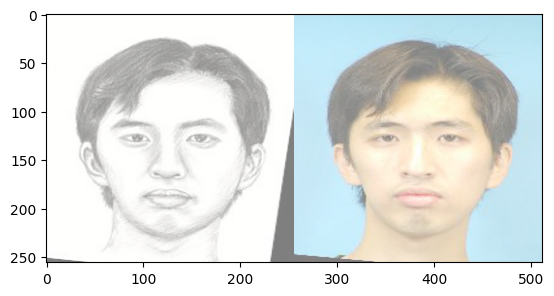

In [ ]:
# Plot example  image
exp = test_loader.__iter__().__next__()
#For seperating sketch with ground truth
img_size = 256
org_yaxis = exp[:, :, :, img_size:].cuda()
org_xaxis = exp[:, :, :, 0:img_size].cuda()
#For plotting
ground_truth_img =((exp[0]).cpu().data.numpy().transpose(1, 2, 0) + 1)/2
mean = np.array([0.5, 0.5, 0.5])
std = np.array([0.5, 0.5, 0.5])
exp = std * ground_truth_img + mean
plt.imshow(exp)


In [ ]:
# Generator of the model
class generator(nn.Module):
  # initializers
  def __init__(self):
    super(generator, self).__init__()

    # Encoder part of the network:
    # Convolutions
    # Number of convolutions are chosen according to the system
    self.conv01 = nn.Conv2d(3, 64, 4, 2, 1)
    self.conv02 = nn.Conv2d(64, 128, 4, 2, 1)
    self.conv03 = nn.Conv2d(128, 256, 4, 2, 1)
    self.conv04 = nn.Conv2d(256, 512, 4, 2, 1)
    self.conv05 = nn.Conv2d(512, 512, 4, 2, 1)
    self.conv06 = nn.Conv2d(512, 512, 4, 2, 1)
    self.conv07 = nn.Conv2d(512, 512, 4, 2, 1)
    self.conv08 = nn.Conv2d(512, 512, 4, 2, 1)

    # Batchnorms to normalize the data between the layers
    self.encoder_batchnorm02 = nn.BatchNorm2d(128)
    self.encoder_batchnorm03 = nn.BatchNorm2d(256)
    self.encoder_batchnorm04 = nn.BatchNorm2d(512)
    self.encoder_batchnorm05 = nn.BatchNorm2d(512)
    self.encoder_batchnorm06 = nn.BatchNorm2d(512)
    self.encoder_batchnorm07 = nn.BatchNorm2d(512)

    # U-net deconvolutions
    self.deconv01 = nn.ConvTranspose2d(512, 512, 4, 2, 1)
    self.deconv02 = nn.ConvTranspose2d(1024, 512, 4, 2, 1)
    self.deconv03 = nn.ConvTranspose2d(1024, 512, 4, 2, 1)
    self.deconv04 = nn.ConvTranspose2d(1024, 512, 4, 2, 1)
    self.deconv05 = nn.ConvTranspose2d(1024, 256, 4, 2, 1)
    self.deconv06 = nn.ConvTranspose2d(512, 128, 4, 2, 1)
    self.deconv07 = nn.ConvTranspose2d(256, 64, 4, 2, 1)
    self.deconv08 = nn.ConvTranspose2d(128, 3, 4, 2, 1)

    # Corresponding batchnorms to normalize the data between the layers
    self.decoder_batchnorm01 = nn.BatchNorm2d(512)
    self.decoder_batchnorm02 = nn.BatchNorm2d(512)
    self.decoder_batchnorm03 = nn.BatchNorm2d(512)
    self.decoder_batchnorm04 = nn.BatchNorm2d(512)
    self.decoder_batchnorm05 = nn.BatchNorm2d(256)
    self.decoder_batchnorm06 = nn.BatchNorm2d(128)
    self.decoder_batchnorm07 = nn.BatchNorm2d(64)

  def weight_init(self, mean, std):
    for m in self._modules:
      if isinstance(self._modules[m], nn.ConvTranspose2d) or isinstance(self._modules[m], nn.Conv2d):
        self._modules[m].weight.data.normal_(mean, std)
        self._modules[m].bias.data.zero_()

  # Encoder forward
  def forward(self, input):
    # Forward pass implementation of the generator
    # encoder part
    generator_e1 = self.conv01(input)
    generator_e2 = self.encoder_batchnorm02(self.conv02(F.leaky_relu(generator_e1, negative_slope=0.3)))
    generator_e3 = self.encoder_batchnorm03(self.conv03(F.leaky_relu(generator_e2, negative_slope=0.3)))
    generator_e4 = self.encoder_batchnorm04(self.conv04(F.leaky_relu(generator_e3, negative_slope=0.3)))
    generator_e5 = self.encoder_batchnorm05(self.conv05(F.leaky_relu(generator_e4, negative_slope=0.3)))
    generator_e6 = self.encoder_batchnorm06(self.conv06(F.leaky_relu(generator_e5, negative_slope=0.3)))
    generator_e7 = self.encoder_batchnorm07(self.conv07(F.leaky_relu(generator_e6, negative_slope=0.3)))
    generator_e8 = self.conv08(F.leaky_relu(generator_e7, negative_slope=0.3))

    # decoder part
    generator_d1 = self.decoder_batchnorm01(self.deconv01(F.relu(generator_e8)))
    generator_d1 = torch.cat([generator_d1, generator_e7], 1)

    generator_d2 = self.decoder_batchnorm02(self.deconv02(F.relu(generator_d1)))
    generator_d2 = torch.cat([generator_d2, generator_e6], 1)

    generator_d3 = self.decoder_batchnorm03(self.deconv03(F.relu(generator_d2)))
    generator_d3 = torch.cat([generator_d3, generator_e5], 1)

    generator_d4 = self.decoder_batchnorm04(self.deconv04(F.relu(generator_d3)))
    generator_d4 = torch.cat([generator_d4, generator_e4], 1)

    generator_d5 = self.decoder_batchnorm05(self.deconv05(F.relu(generator_d4)))
    generator_d5 = torch.cat([generator_d5, generator_e3], 1)

    generator_d6 = self.decoder_batchnorm06(self.deconv06(F.relu(generator_d5)))
    generator_d6 = torch.cat([generator_d6, generator_e2], 1)

    generator_d7 = self.decoder_batchnorm07(self.deconv07(F.relu(generator_d6)))
    generator_d7 = torch.cat([generator_d7, generator_e1], 1)

    generator_d8 = self.deconv08(F.relu(generator_d7))


    output = torch.tanh(generator_d8)
    return output

class discriminator(nn.Module):
  # initializers
  def __init__(self):
    super(discriminator, self).__init__()

    # Discriminator layers
    self.conv01 = nn.Conv2d(6, 64, 4, stride=2, padding=1)
    self.conv02 = nn.Conv2d(64, 128, 4, stride=2, padding=1)
    self.conv03 = nn.Conv2d(128, 256, 4, stride=2, padding=1)
    self.conv04 = nn.Conv2d(256, 512, 4, stride=1, padding=1)
    self.conv05 = nn.Conv2d(512, 1, 4, stride=1, padding=1)

    self.encoder_batchnorm02 = nn.BatchNorm2d(128)
    self.encoder_batchnorm03 = nn.BatchNorm2d(256)
    self.encoder_batchnorm04 = nn.BatchNorm2d(512)

  # Disctiminator forward
  def forward(self, input):
    disc = self.conv01(input)
    disc = self.encoder_batchnorm02(self.conv02(F.leaky_relu(disc, negative_slope=0.3)))
    disc = self.encoder_batchnorm03(self.conv03(F.leaky_relu(disc, negative_slope=0.3)))
    disc = self.encoder_batchnorm04(self.conv04(F.leaky_relu(disc, negative_slope=0.3)))
    disc = self.conv05(F.leaky_relu(disc, negative_slope=0.3))
    disc = torch.sigmoid(disc)
    return disc

  def weight_init(self, mean, std):
    for m in self._modules:
      if isinstance(self._modules[m], nn.ConvTranspose2d) or isinstance(self._modules[m], nn.Conv2d):
        self._modules[m].weight.data.normal_(mean, std)
        self._modules[m].bias.data.zero_()


In [ ]:
def show_result(G, input_x, input_y, num_epoch):
  predict_images = G(input_x)
  # Plot for all 5 images for input ground truth and output
  fig, ax = plt.subplots(input_x.size()[0], 3, figsize=(6,20))
  for i in range(input_x.size()[0]):
    ax[i, 0].get_xaxis().set_visible(False)
    ax[i, 0].get_yaxis().set_visible(False)
    ax[i, 0].cla()
    ax[i, 0].imshow((input_x[i].cpu().data.numpy().transpose(1, 2, 0) + 1)/2)

    ax[i, 1].get_xaxis().set_visible(False)
    ax[i, 1].get_yaxis().set_visible(False)
    ax[i, 1].cla()
    ax[i, 1].imshow((predict_images[i].cpu().data.numpy().transpose(1, 2, 0) + 1)/2)

    ax[i, 2].get_xaxis().set_visible(False)
    ax[i, 2].get_yaxis().set_visible(False)
    ax[i, 2].cla()
    ax[i, 2].imshow((input_y[i].cpu().data.numpy().transpose(1, 2, 0) + 1)/2)

  # Plotting specifications
  plt.tight_layout()
  label_epoch = 'Epoch {0}'.format(num_epoch)
  fig.text(0.5, 0, label_epoch, ha='center')
  label_input = 'Input'
  fig.text(0.18, 1, label_input, ha='center')
  label_output = 'Output'
  fig.text(0.5, 1, label_output, ha='center')
  label_truth = 'Ground truth'
  fig.text(0.81, 1, label_truth, ha='center')

  plt.show()


In [ ]:
BCE_loss = nn.BCELoss().cuda()
L1_loss = nn.L1Loss().cuda()

def train(G, D, num_epochs = 20, only_L1 = False):
  hist_Disc_loss = []
  hist_Gen_loss = []
  hist_Gen_L1_loss = []
  # Generator and Discriminator optimizers
  Gen_optimizer = optim.Adam(G.parameters(), lr=0.0002, betas=(0.5, 0.999))
  Disc_optimizer = optim.Adam(D.parameters(), lr=0.0002, betas=(0.5, 0.999))

  for epoch in range(num_epochs):
    Disc_loss = []
    Gen_loss = []
    num_of_iter = 0
    for image_x in train_loader:

      # image_x is the sketch of real images,image_y is the actual real images
      image_y = image_x[:, :, :, img_size:]
      image_x = image_x[:, :, :, 0:img_size]
      image_x, image_y = image_x.cuda(), image_y.cuda()

      # Training and calculate the loss from generated fake images
      D.zero_grad()
      true_img = torch.cat([image_x, image_y], 1)
      disc_result_ti = D(true_img)
      real_loss = BCE_loss(disc_result_ti, Variable(torch.ones(disc_result_ti.size()).cuda()))

      gen_img = G(image_x)
      fake_img = torch.cat([image_x, gen_img], 1)
      disc_result_fi = D(fake_img)
      fake_loss = BCE_loss(disc_result_fi, Variable(torch.zeros(disc_result_fi.size()).cuda()))
      # Calculate discriminator loss and use backward class to calculate the backpropogation
      disc_loss = 0.5 * real_loss + 0.5 * fake_loss
      disc_loss.backward()
      Disc_optimizer.step()
      loss_Disc = disc_loss

      G.zero_grad()
      Gen_result = G(image_x)
      Disc_input = torch.cat([image_x, Gen_result], 1)
      Disc_result = D(Disc_input).squeeze()

      if only_L1:
        Gen_train_loss = L1_loss(Gen_result, image_y)
        hist_Gen_loss.append(L1_loss(Gen_result, image_y).detach().item())
      #For BCE
      else:
        Gen_train_loss = BCE_loss(Disc_result, torch.ones(Disc_result.size()).cuda()) + 100 * L1_loss(Gen_result, image_y)
        hist_Gen_L1_loss.append(L1_loss(Gen_result, image_y).detach().item())
        hist_Gen_loss.append(BCE_loss(Disc_result, torch.ones(Disc_result.size()).cuda()).detach().item())

      # To learn from
      Gen_train_loss.backward()
      Gen_optimizer.step()
      loss_G = Gen_train_loss.detach().item()
      Disc_loss.append(loss_Disc)
      hist_Disc_loss.append(loss_Disc)
      Gen_loss.append(loss_G)
      num_of_iter += 1


    print('[%d/%d] epoch' % ((epoch + 1), num_epochs))
    print('Loss of generator G: %.3f' % (torch.mean(torch.FloatTensor(Gen_loss))))
    print('Loss of discriminator D: %.3f' % (torch.mean(torch.FloatTensor(Disc_loss))))

    if epoch == 0 or (epoch + 1) % 10 == 0:
      with torch.no_grad():
        show_result(G, org_xaxis, org_yaxis, (epoch+1))
        #predict_images = G(org_xaxis)
        #plt.imshow(((predict_images).cpu().data.numpy().transpose(1, 2, 0) + 1) / 2)

  return hist_Disc_loss, hist_Gen_loss, hist_Gen_L1_loss

[1/25] epoch
Loss of generator G: 34.409
Loss of discriminator D: 0.840


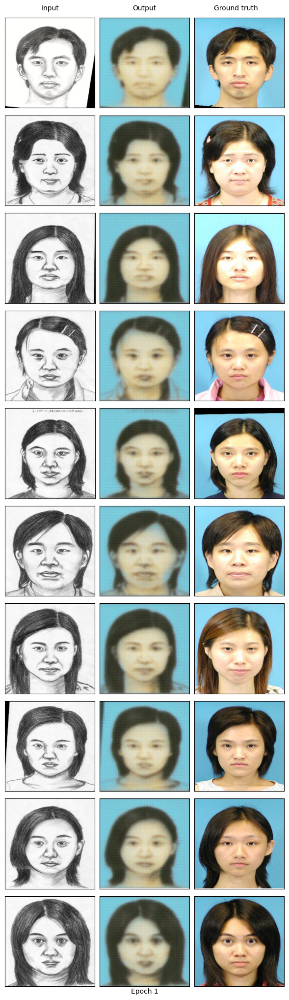

[2/25] epoch
Loss of generator G: 19.705
Loss of discriminator D: 0.660
[3/25] epoch
Loss of generator G: 17.093
Loss of discriminator D: 0.661
[4/25] epoch
Loss of generator G: 16.229
Loss of discriminator D: 0.550
[5/25] epoch
Loss of generator G: 15.981
Loss of discriminator D: 0.422
[6/25] epoch
Loss of generator G: 16.068
Loss of discriminator D: 0.463
[7/25] epoch
Loss of generator G: 15.105
Loss of discriminator D: 0.707
[8/25] epoch
Loss of generator G: 14.539
Loss of discriminator D: 0.628
[9/25] epoch
Loss of generator G: 13.606
Loss of discriminator D: 0.667
[10/25] epoch
Loss of generator G: 12.784
Loss of discriminator D: 0.627


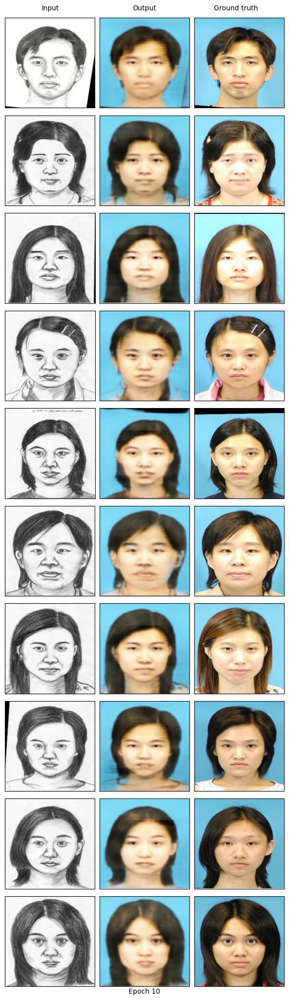

[11/25] epoch
Loss of generator G: 12.597
Loss of discriminator D: 0.661
[12/25] epoch
Loss of generator G: 11.977
Loss of discriminator D: 0.622
[13/25] epoch
Loss of generator G: 11.499
Loss of discriminator D: 0.724
[14/25] epoch
Loss of generator G: 11.447
Loss of discriminator D: 0.639
[15/25] epoch
Loss of generator G: 11.052
Loss of discriminator D: 0.621
[16/25] epoch
Loss of generator G: 10.424
Loss of discriminator D: 0.660
[17/25] epoch
Loss of generator G: 10.234
Loss of discriminator D: 0.646
[18/25] epoch
Loss of generator G: 10.077
Loss of discriminator D: 0.636
[19/25] epoch
Loss of generator G: 9.595
Loss of discriminator D: 0.664
[20/25] epoch
Loss of generator G: 9.292
Loss of discriminator D: 0.643


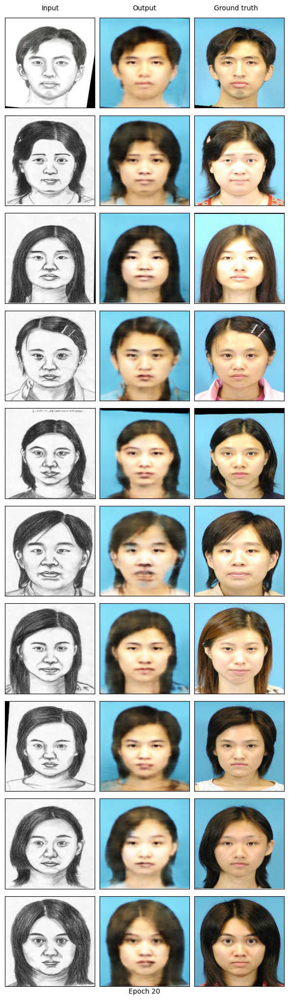

[21/25] epoch
Loss of generator G: 9.236
Loss of discriminator D: 0.631
[22/25] epoch
Loss of generator G: 9.044
Loss of discriminator D: 0.699
[23/25] epoch
Loss of generator G: 8.947
Loss of discriminator D: 0.602
[24/25] epoch
Loss of generator G: 9.000
Loss of discriminator D: 0.641
[25/25] epoch
Loss of generator G: 8.803
Loss of discriminator D: 0.601


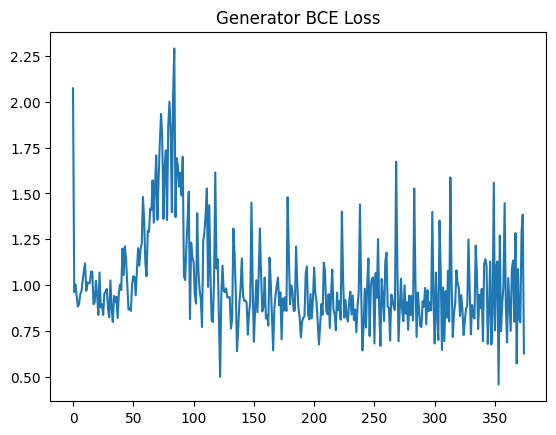

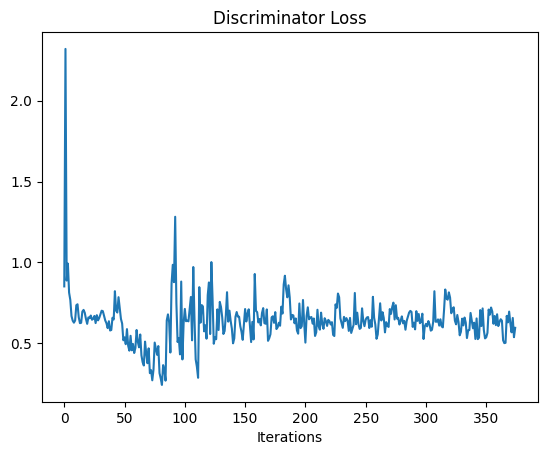

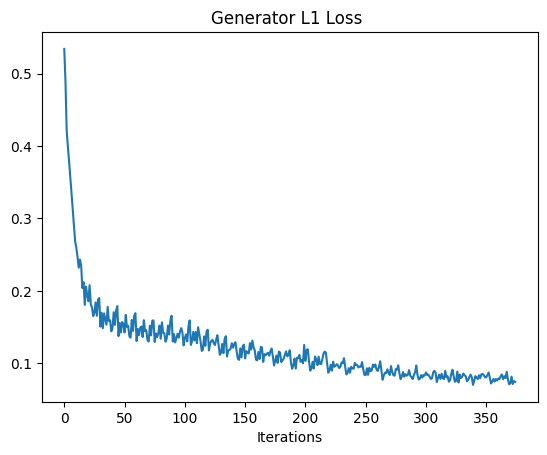

In [ ]:
# Define network
G_10 = generator()
D_10 = discriminator()
G_10.weight_init(mean=0.0, std=0.02)
D_10.weight_init(mean=0.0, std=0.02)
G_10.cuda()
D_10.cuda()
G_10.train()
D_10.train()
#training
hist_D_10_losses, hist_G_10_BCE_losses, hist_G_10_L1_losses = train(G_10, D_10, num_epochs = 25, only_L1 = False)

# Plot the BCE loss
plt.title('Generator BCE Loss')
plt.plot(hist_G_10_BCE_losses, label='Discriminator loss')
plt.show()
plt.title('Discriminator Loss')
plt.xlabel('Iterations')
plt.plot(torch.stack(hist_D_10_losses).detach().cpu(), label='Discriminator loss')
plt.show()
plt.title('Generator L1 Loss ')
plt.xlabel('Iterations')
plt.plot(hist_G_10_L1_losses, label='Discriminator loss')


[1/20] epoch
Loss of generator G: 0.361
Loss of discriminator D: 0.792


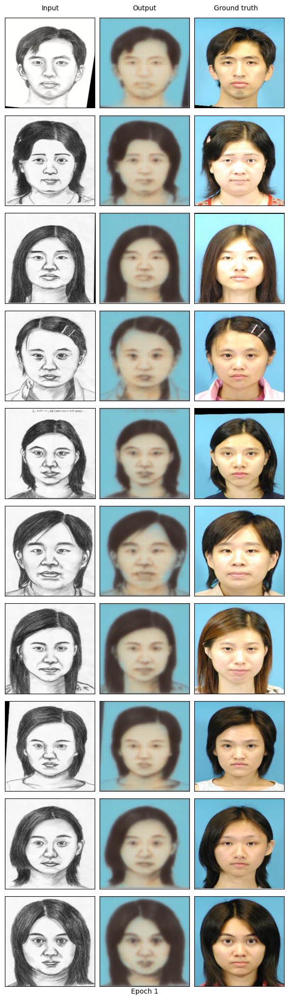

[2/20] epoch
Loss of generator G: 0.197
Loss of discriminator D: 0.589
[3/20] epoch
Loss of generator G: 0.163
Loss of discriminator D: 0.629
[4/20] epoch
Loss of generator G: 0.152
Loss of discriminator D: 0.563
[5/20] epoch
Loss of generator G: 0.146
Loss of discriminator D: 0.445
[6/20] epoch
Loss of generator G: 0.141
Loss of discriminator D: 0.281
[7/20] epoch
Loss of generator G: 0.134
Loss of discriminator D: 0.181
[8/20] epoch
Loss of generator G: 0.129
Loss of discriminator D: 0.088
[9/20] epoch
Loss of generator G: 0.128
Loss of discriminator D: 0.059
[10/20] epoch
Loss of generator G: 0.121
Loss of discriminator D: 0.057


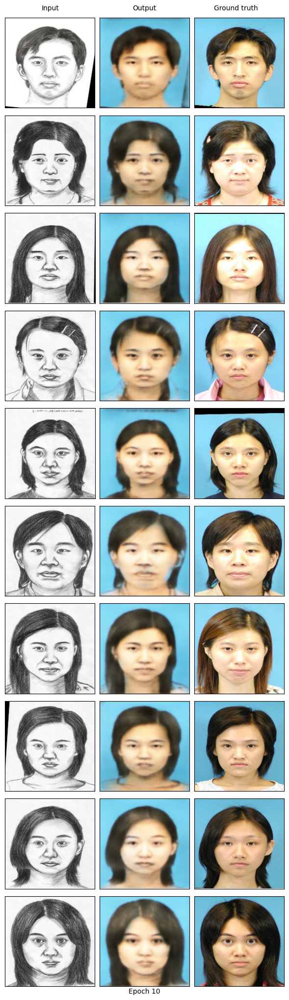

[11/20] epoch
Loss of generator G: 0.115
Loss of discriminator D: 0.388
[12/20] epoch
Loss of generator G: 0.115
Loss of discriminator D: 0.129
[13/20] epoch
Loss of generator G: 0.109
Loss of discriminator D: 0.326
[14/20] epoch
Loss of generator G: 0.104
Loss of discriminator D: 0.235
[15/20] epoch
Loss of generator G: 0.101
Loss of discriminator D: 0.209
[16/20] epoch
Loss of generator G: 0.098
Loss of discriminator D: 0.197
[17/20] epoch
Loss of generator G: 0.094
Loss of discriminator D: 0.155
[18/20] epoch
Loss of generator G: 0.090
Loss of discriminator D: 0.291
[19/20] epoch
Loss of generator G: 0.087
Loss of discriminator D: 0.474
[20/20] epoch
Loss of generator G: 0.086
Loss of discriminator D: 0.309


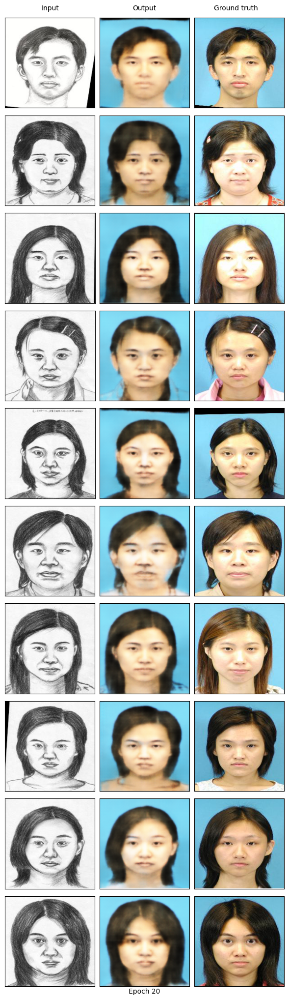

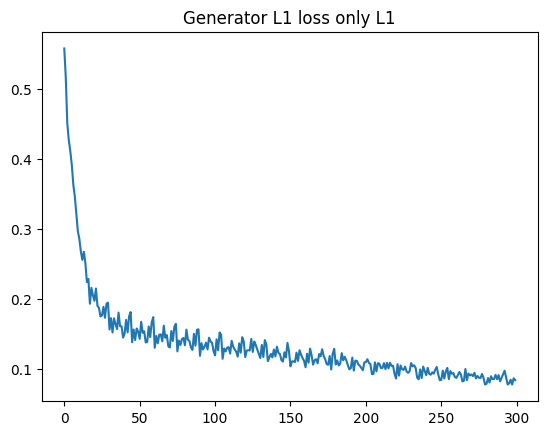

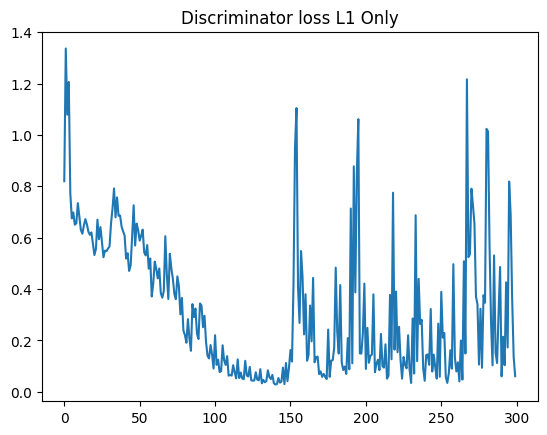

In [ ]:
# Define network
G_L1 = generator()
D_L1 = discriminator()
G_L1.weight_init(mean=0.0, std=0.02)
D_L1.weight_init(mean=0.0, std=0.02)
G_L1.cuda()
D_L1.cuda()
G_L1.train()
D_L1.train()
# training
hist_D_L1_losses, hist_G_L1_losses, _ = train(G_L1, D_L1, num_epochs = 20,only_L1 = True)
plt.title('Generator L1 loss only L1')
plt.plot(hist_G_L1_losses, label='Discriminator loss')
plt.show()
plt.title('Discriminator loss L1 Only')
plt.plot(torch.stack(hist_D_L1_losses).detach().cpu(), label='Discriminator loss')
plt.show()

In [ ]:
!cp "./models/" -r "/content/drive/My Drive/"

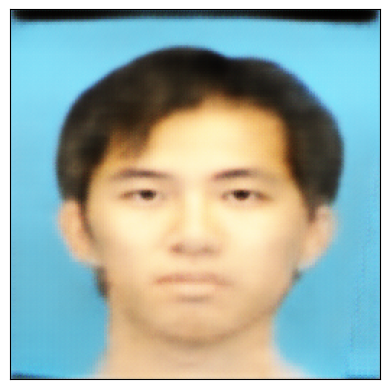

In [ ]:
#prediction example
predicted_1 = G_L1(org_xaxis).cpu().data.numpy()
final_predicted_im = (predicted_1[0].transpose(1, 2, 0) + 1) /2
ax = plt.gca()
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
ax.cla()
plt.imshow(final_predicted_im)

In [ ]:
!pip install scikit-image

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
#G-10 best SSIM
import cv2
from skimage.metrics import structural_similarity as ssim
predicted_1 = G_10(org_xaxis).cpu().data.numpy()
temp_maxSSIM = 0
for i in range(0, len(predicted_1)):
  final_predicted_im = (predicted_1[i].transpose(1, 2, 0) + 1) /2
  ground_truth_img =((org_yaxis[i]).cpu().data.numpy().transpose(1, 2, 0) + 1)/2
  grayA = cv2.cvtColor(ground_truth_img, cv2.COLOR_BGR2GRAY)
  grayB = cv2.cvtColor(final_predicted_im, cv2.COLOR_BGR2GRAY)
  (score, diff) = ssim(grayA, grayB, full=True)
  if score > temp_maxSSIM:
    temp_maxSSIM = score
    tem_maxSSIM_image = final_predicted_im
print("SSIM: {}".format(temp_maxSSIM))
plt.imsave("/content/drive/MyDrive/Colab Notebooks/project/out1.jpg", tem_maxSSIM_image)

NameError: ignored

In [ ]:
#G-L1 best SSIM
import cv2
from skimage.metrics import structural_similarity as ssim
predicted_1 = G_L1(org_xaxis).cpu().data.numpy()
temp_maxSSIM = 0
for i in range(0, len(predicted_1)):
  final_predicted_im = (predicted_1[i].transpose(1, 2, 0) + 1) /2
  ground_truth_img =((org_yaxis[i]).cpu().data.numpy().transpose(1, 2, 0) + 1)/2
  grayA = cv2.cvtColor(ground_truth_img, cv2.COLOR_BGR2GRAY)
  grayB = cv2.cvtColor(final_predicted_im, cv2.COLOR_BGR2GRAY)
  (score, diff) = ssim(grayA, grayB, full=True)
  if score > temp_maxSSIM:
    temp_maxSSIM = score
    tem_maxSSIM_image = final_predicted_im
print("SSIM: {}".format(temp_maxSSIM))
plt.imsave("/content/drive/MyDrive/Colab Notebooks/project/out2.jpg", tem_maxSSIM_image)

In [ ]:
!pip install -U scikit-image==0.18.0
!pip install PyYAML==5.4.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
pip install scikit-image

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import imageio
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from skimage.transform import resize
from IPython.display import HTML
import warnings
warnings.filterwarnings("ignore")

In [ ]:
cd first-order-model

/content/first-order-model


In [ ]:

source_image = imageio.imread('/content/drive/MyDrive/Colab Notebooks/project/out1.jpg')
reader = imageio.get_reader('/content/drive/MyDrive/Colab Notebooks/project/20230416_150228.mp4')


#Resize image and video to 256x256

source_image = resize(source_image, (256, 256))[..., :3]

fps = reader.get_meta_data()['fps']
driving_video = []
try:
    for im in reader:
        driving_video.append(im)
except RuntimeError:
    pass
reader.close()

driving_video = [resize(frame, (256, 256))[..., :3] for frame in driving_video]

def display(source, driving, generated=None):
    fig = plt.figure(figsize=(8 + 4 * (generated is not None), 6))

    ims = []
    for i in range(len(driving)):
        cols = [source]
        cols.append(driving[i])
        if generated is not None:
            cols.append(generated[i])
        im = plt.imshow(np.concatenate(cols, axis=1), animated=True)
        plt.axis('off')
        ims.append([im])

    ani = animation.ArtistAnimation(fig, ims, interval=50, repeat_delay=1000)
    plt.close()
    return ani


HTML(display(source_image, driving_video).to_html5_video())

In [ ]:
!pip install -U scikit-image==0.18.0
!pip install -U imageio av
!pip install ffmpeg-python

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from demo import load_checkpoints
import imageio.v3 as iio
generator, kp_detector = load_checkpoints(config_path='config/vox-256.yaml',
                            checkpoint_path='/content/drive/MyDrive/Colab Notebooks/project/vox-cpk.pth.tar')

from demo import make_animation
from skimage import img_as_ubyte

predictions = make_animation(source_image, driving_video, generator, kp_detector, relative=False, adapt_movement_scale=True)
HTML(display(source_image, driving_video, predictions).to_html5_video())

  0%|          | 0/251 [00:00<?, ?it/s]

This code is based on pix2pix base code(https://www.tensorflow.org/tutorials/generative/pix2pix).
The input taking part is combination between pix2pix base code and High-Quality Facial Photo-Sketch Synthesis Using Multi-Adversarial Networks( https://github.com/lidan1/PhotoSketchMAN/blob/master/net/networks.py).
The printing results part is inspired from (https://github.com/togheppi/pix2pix/blob/master/utils.py)
The generator discriminator code is based on the combination of 3 architectures given above.
The image animation part the necessary code and files are downloaded from Aliaksandr Siarohin’s workpage https://github.com/AliaksandrSiarohin/first-order-model